# When using different training data, the result for a region could has different label, this notebook is to relabel it

# Load fitted data

In [1]:
# define the path of the data and project
fitted_data_path = 'D:/VScode/MRes/Clustering_under_the_ice/fitted_data/'

In [2]:
# load the training data
import xarray as xr

ds_fit_750_latlonT_5_60_95_k4= xr.open_dataset(fitted_data_path + 'ds_fit_750_latlonT_5_60_95_k4.nc')
ds_fit_750_latlonT_5_50_95_k4= xr.open_dataset(fitted_data_path + 'ds_fit_750_latlonT_5_50_95_k4.nc')
ds_fit_750_latlonT_5_70_95_k4= xr.open_dataset(fitted_data_path + 'ds_fit_750_latlonT_5_70_95_k4.nc')

ds_fit_250_latlonT_10_20_95_k4=xr.open_dataset(fitted_data_path + 'ds_fit_250_latlonT_10_20_95_k4.nc')
ds_fit_250_latlonT_10_10_95_k4=xr.open_dataset(fitted_data_path + 'ds_fit_250_latlonT_10_10_95_k4.nc')
ds_fit_250_latlonT_10_30_95_k4=xr.open_dataset(fitted_data_path + 'ds_fit_250_latlonT_10_30_95_k4.nc')



# Define functions to compare labels of the fitted data

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from matplotlib.colors import ListedColormap

def compare_labels(ds0, ds1, ds2, show_title=False):
    """
    Plot labels on a map.

    Args:
        ds0: The first input dataset.
        ds1: The second input dataset.
        ds2: The third input dataset.
        show_title (bool): Whether to show the title. Default is False.
    """

    fig, axs = plt.subplots(1,3,figsize=(18, 6), dpi=300)
    
    lon_min, lon_max = -180, 180
    lat_min, lat_max = 70, 90
    lat_step = 10
    lon_step = 20

    # Define your own color list
    color_list = ['red', 'saddlebrown', 'deepskyblue', 'purple','black','darkorange','forestgreen']
    cmap = ListedColormap(color_list)

    for i in range(3):
        if i==0:
            ds=ds0
        if i==1:
            ds=ds1
        if i==2:
            ds=ds2
            
        # Get the unique labels
        unique_labels = np.unique(ds.PCM_LABELS.values)
        num_labels = len(unique_labels)
        ax=axs[i]

        m = Basemap(projection='npstere', boundinglat=lat_min, lon_0=0, resolution='l', ax=ax)

        m.drawparallels(np.arange(lat_min, lat_max + 1, lat_step), labels=[], linewidth=0.1)
        m.drawcoastlines()
        m.fillcontinents(color='grey', lake_color='lightblue')
        m.drawmeridians(np.arange(lon_min, lon_max + 1, lon_step), labels=[1, 0, 0, 1], linewidth=0.1)


        x, y = m(ds['lon'], ds['lat'])
        sc = m.scatter(x, y, s=3, c=ds.PCM_LABELS.values, cmap=cmap, vmin=0, vmax=num_labels-1)

        cbar = plt.colorbar(sc, ax=ax, shrink=0.7, pad=0.02)
        cbar.ax.set_ylabel('class')
        cbar.set_ticks(np.arange(0, num_labels, 1))

        # Add a title and set the font size
        if show_title:
            # ax.set_title(f'lat_step={ds.lat_step.values}, lon_step={ds.lon_step.values}, quantile4T={ds.quantile4T.values},nprof_of_train={ds.nprof_of_train.values}')
            ax.set_title(f'lat_step={ds.lat_step.values}, lon_step={ds.lon_step.values},nprof_of_training={ds.nprof_of_train.values}')

        for lat in np.arange(lat_min, lat_max + 1, lat_step):
            if lat < 80:
                x, y = m(0, lat+1)
            else:
                x, y = m(0, lat)

            ax.text(x, y, f'{lat}°N', fontsize=8, ha='center', va='center', color='k',
                    bbox=dict(facecolor='w', edgecolor='None', alpha=1))

    plt.show()



# Compare results from different training data, they have different label for profiles in a region

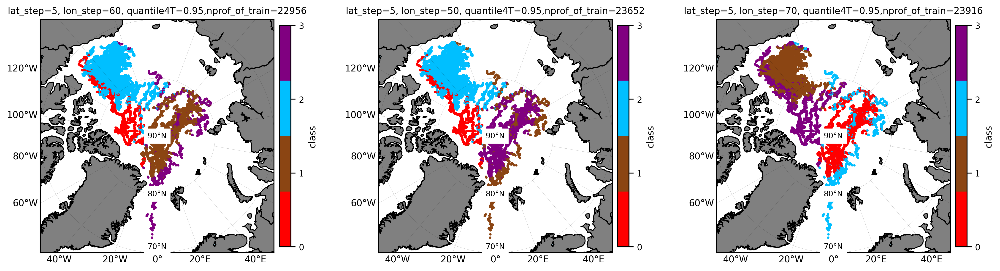

In [23]:
compare_labels(ds_fit_750_latlonT_5_60_95_k4,ds_fit_750_latlonT_5_50_95_k4,ds_fit_750_latlonT_5_70_95_k4,show_title=True)

If we use the colors in 'ds_fit_750_latlonT_5_60_95_k4' as reference, the color remapping of other two data should be:\
\
ds_fit_750_latlonT_5_50_95_k4: {0:0, 1:3, 2:2, 3:1}\
\
ds_fit_750_latlonT_5_70_95_k4: {0:1, 1:2, 2:3, 3:0}

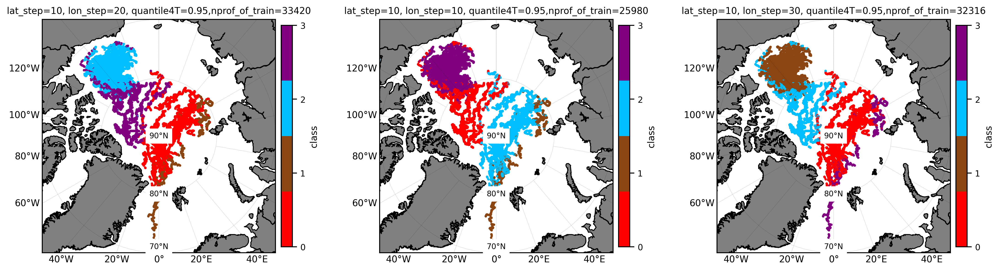

In [24]:
compare_labels(ds_fit_250_latlonT_10_20_95_k4,ds_fit_250_latlonT_10_10_95_k4,ds_fit_250_latlonT_10_30_95_k4,show_title=True)

If we use the colors in 'ds_fit_750_latlonT_5_60_95_k4' as reference, the color remapping of the 250 data should be:\
\
ds_fit_250_latlonT_10_20_95_k4: {0:1,1:3,2:2,3:0}\
\
ds_fit_250_latlonT_10_10_95_k4: {0:0, 1:3, 2:1, 3:2}\
\
ds_fit_250_latlonT_10_30_95_k4: {0:1, 1:2, 2:0, 3:3}

# Define function to relabel the result

In [11]:
import numpy as np
import xarray as xr

def relabel_pcm_labels(ds: xr.Dataset, label_mapping: dict = {0: 0, 1: 1, 2: 2, 3: 3}) -> xr.Dataset:
    """
    Relabels the PCM_LABELS and updates PCM_POST values in the input dataset.

    Parameters:
        - ds (xr.Dataset): Input dataset containing 'PCM_LABELS' and 'PCM_POST' variables.
        - label_mapping (dict): Mapping of original labels to new labels. Default is {0: 0, 1: 3, 2: 1, 3: 2}.

    Returns:
        - ds (xr.Dataset): Updated dataset with relabeled 'PCM_LABELS' and 'PCM_POST' variables.
    """
    ds=ds.copy()
    unique_labels = np.unique(ds.PCM_LABELS.values)
    num_classes = len(unique_labels)
    if num_classes > 4:
        print('The number of unique labels is not 4, please check the input ds')
        return ds

    # Find the indices where the label is 0, 1, 2, and 3
    idx_0 = np.where(ds['PCM_LABELS'] == 0)
    idx_1 = np.where(ds['PCM_LABELS'] == 1)
    idx_2 = np.where(ds['PCM_LABELS'] == 2)
    idx_3 = np.where(ds['PCM_LABELS'] == 3)

    # Set the values in idx_0 to 1, idx_1 to 3, idx_2 to 1, and idx_3 to 2
    ds['PCM_LABELS'][idx_0] = label_mapping[0]
    ds['PCM_LABELS'][idx_1] = label_mapping[1]
    ds['PCM_LABELS'][idx_2] = label_mapping[2]
    ds['PCM_LABELS'][idx_3] = label_mapping[3]

    # Copy the PCM_POST values
    p0 = ds['PCM_POST'].values[0].copy()
    p1 = ds['PCM_POST'].values[1].copy()
    p2 = ds['PCM_POST'].values[2].copy()
    p3 = ds['PCM_POST'].values[3].copy()

    # Update the PCM_POST values
    ds['PCM_POST'].values[label_mapping[0]] = p0
    ds['PCM_POST'].values[label_mapping[2]] = p2
    ds['PCM_POST'].values[label_mapping[3]] = p3
    ds['PCM_POST'].values[label_mapping[1]] = p1

    return ds


# Relabel the data and check the result

# For 750 data

In [33]:
ds_fit_relabeled_750_latlonT_5_60_95_k4=ds_fit_750_latlonT_5_60_95_k4
ds_fit_relabeled_750_latlonT_5_50_95_k4=relabel_pcm_labels(ds_fit_750_latlonT_5_50_95_k4,{0:0, 1:3, 2:2, 3:1})
ds_fit_relabeled_750_latlonT_5_70_95_k4=relabel_pcm_labels(ds_fit_750_latlonT_5_70_95_k4,{0:1, 1:2, 2:3, 3:0})


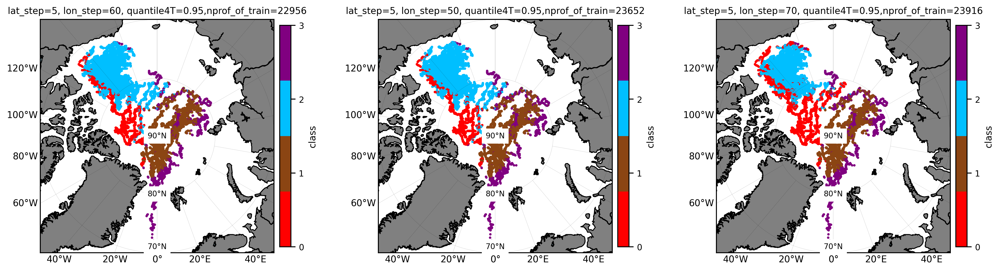

In [34]:
compare_labels(ds_fit_750_latlonT_5_60_95_k4,ds_fit_750_latlonT_5_50_95_k4,ds_fit_750_latlonT_5_70_95_k4,show_title=True)

In [35]:
# save the relabeled data
Relabeled_data_path = 'D:/VScode/MRes/Clustering_under_the_ice/Relabeled_data/'
ds_fit_relabeled_750_latlonT_5_60_95_k4.to_netcdf(Relabeled_data_path + 'ds_fit_relabeled_750_latlonT_5_60_95_k4.nc')
ds_fit_relabeled_750_latlonT_5_50_95_k4.to_netcdf(Relabeled_data_path + 'ds_fit_relabeled_750_latlonT_5_50_95_k4.nc')
ds_fit_relabeled_750_latlonT_5_70_95_k4.to_netcdf(Relabeled_data_path + 'ds_fit_relabeled_750_latlonT_5_70_95_k4.nc')

# For 250 data

In [39]:
ds_fit_relabeled_250_latlonT_10_20_95_k4=relabel_pcm_labels(ds_fit_250_latlonT_10_20_95_k4,{0:1,1:3,2:2,3:0})
ds_fit_relabeled_250_latlonT_10_10_95_k4=relabel_pcm_labels(ds_fit_250_latlonT_10_10_95_k4,{0:0, 1:3, 2:1, 3:2})
ds_fit_relabeled_250_latlonT_10_30_95_k4=relabel_pcm_labels(ds_fit_250_latlonT_10_30_95_k4,{0:1, 1:2, 2:0, 3:3})


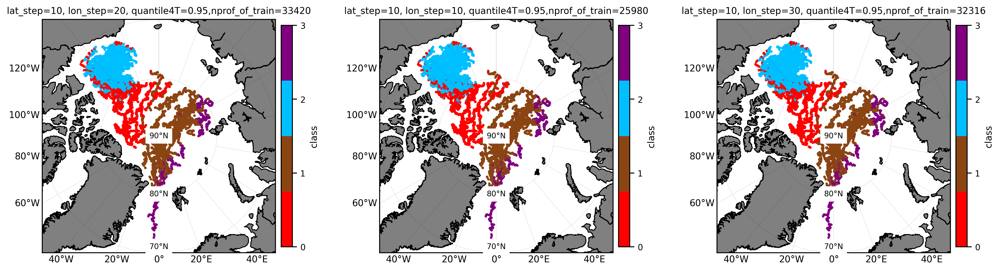

In [40]:
compare_labels(ds_fit_relabeled_250_latlonT_10_20_95_k4,ds_fit_relabeled_250_latlonT_10_10_95_k4,ds_fit_relabeled_250_latlonT_10_30_95_k4,show_title=True)

In [41]:
# save the relabeled data
Relabeled_data_path = 'D:/VScode/MRes/Clustering_under_the_ice/Relabeled_data/'
ds_fit_relabeled_250_latlonT_10_20_95_k4.to_netcdf(Relabeled_data_path + 'ds_fit_relabeled_250_latlonT_10_20_95_k4.nc')
ds_fit_relabeled_250_latlonT_10_10_95_k4.to_netcdf(Relabeled_data_path + 'ds_fit_relabeled_250_latlonT_10_10_95_k4.nc')
ds_fit_relabeled_250_latlonT_10_30_95_k4.to_netcdf(Relabeled_data_path + 'ds_fit_relabeled_250_latlonT_10_30_95_k4.nc')

# Define functions to compare some more properties

In [19]:
import matplotlib.pyplot as plt

def compare_average_profile(ds0,ds1,ds2, showtitle=False, showlegend=False)-> None:
    
    """
    compare the average profile for fitted data.

    Args:
        ds0: The input dataset, xarray.
        ds1: The input dataset, xarray.
        ds2: The input dataset, xarray.
    """

    fig, axs = plt.subplots(2, 3, figsize=(12, 8), dpi=300)
    color_list = ['red', 'saddlebrown', 'deepskyblue',  'purple']  # Define your own color list

    for j in range(3):
        if j==0:
            ds_fit=ds0
        if j==1:
            ds_fit=ds1
        if j==2:
            ds_fit=ds2

        unique_labels = np.unique(ds_fit.PCM_LABELS.values)
        num_classes = len(unique_labels)

        for i in range(num_classes):
            ds_class = ds_fit.where(ds_fit.PCM_LABELS == i, drop=True)

            qua5_temp = np.quantile(ds_class['temperature'], 0.05, axis=0)
            qua95_temp = np.quantile(ds_class['temperature'], 0.95, axis=0)
            qua50_temp = np.quantile(ds_class['temperature'], 0.50, axis=0)

            qua5_salinity = np.quantile(ds_class['salinity'], 0.05, axis=0)
            qua95_salinity = np.quantile(ds_class['salinity'], 0.95, axis=0)
            qua50_salinity = np.quantile(ds_class['salinity'], 0.50, axis=0)

            ax = axs[0,j]
            # ax.grid(True)
            ax.plot(qua50_temp, ds_fit['pressure'].values, c=color_list[i], label=f'Class {i}')
            ax.fill_betweenx(ds_fit['pressure'].values, qua5_temp, qua95_temp, color=color_list[i], alpha=0.5)
            if showlegend:
                if j==0:
                    ax.legend(loc='lower left')
            ax.set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
            if j==0:
                ax.set_ylabel('Pressure (dbar)')
            else:
                ax.set_yticklabels([])
            ax.set_xlabel('Temperature (°C)')
            yticklabels = [str(abs(int(tick))) for tick in ax.get_yticks()]
            ax.set_yticklabels(yticklabels)
            if showtitle:
                ax.set_title(f'lat_step={ds_fit.lat_step.values}, lon_step={ds_fit.lon_step.values}')


            ax = axs[1,j]
            # ax.grid(True)
            ax.plot(qua50_salinity, ds_fit['pressure'].values, c=color_list[i], label=f'Class {i}')
            ax.fill_betweenx(ds_fit['pressure'].values, qua5_salinity, qua95_salinity, color=color_list[i], alpha=0.5)
            ax.set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
            # ax.legend(loc='lower left')
            if j==0:
                ax.set_ylabel('Pressure (dbar))')
            else:
                ax.set_yticklabels([])
            ax.set_xlabel('Salinity (g/kg)')
            yticklabels = [str(abs(int(tick))) for tick in ax.get_yticks()]
            ax.set_yticklabels(yticklabels)

    plt.show()


##############################################################################################################


# compare the likelihood of each class
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

def compare_probability(ds0,ds1,ds2,class2compare=0)->None:
    """
    Compare the likelihood of each class and visualize it on a map.

    Args:
        ds0: The input dataset 0 (xarray).
        ds1: The input dataset 1 (xarray).
        ds2: The input dataset 2 (xarray).
        class2compare: The class index to compare (default: 0).

    Returns:
        None
    """

    lon_min, lon_max = -180, 180
    lat_min, lat_max = 70, 90
    lat_step = 10
    lon_step = 20

    fig, axs = plt.subplots(1, 3, figsize=(18, 6 ), dpi=300)

    for i in range(3):
        ax=axs[i]
        m = Basemap(projection='npstere', boundinglat=lat_min, lon_0=0, resolution='l', ax=ax)

        if i==0:
            ds=ds0
        if i==1:
            ds=ds1
        if i==2:
            ds=ds2
 
        pcm_post = ds.PCM_POST.values[class2compare, :]
        x, y = m(ds['lon'], ds['lat'])
        
        m.drawparallels(np.arange(lat_min, lat_max + 1, lat_step), labels=[], linewidth=0.1)
        m.drawcoastlines()
        m.fillcontinents(color='grey', lake_color='lightblue')
        m.drawmeridians(np.arange(lon_min, lon_max + 1, lon_step), labels=[1, 0, 0, 1], linewidth=0.1)

       
        # pcm_post[pcm_post < 0.4] = 0.05

        sc = m.scatter(x, y, s=3, c=np.array([pcm_post]), cmap='Blues', vmin=0, vmax=np.max(pcm_post))
        # plot the pcm_post larger than 0.5
        m.scatter(x[pcm_post > 0.5], y[pcm_post > 0.5], s=3, c=np.array([pcm_post[pcm_post > 0.5]]), cmap='Blues', vmin=0, vmax=np.max(pcm_post))

        cbar = plt.colorbar(sc, ax=ax, shrink=0.7, pad=0.02)
        cbar.ax.set_ylabel('Probability')
        # add a title and set the font size
        # ax.set_title(f'Probability of class {class2compare}', fontsize=12)
        ax.set_title(f'lat_step={ds.lat_step.values}, lon_step={ds.lon_step.values}, p of class {class2compare}')

        for lat in np.arange(lat_min, lat_max + 1, lat_step):
            if lat < 80:
                x, y = m(0, lat+1)
            else:
                x, y = m(0, lat)
                
            ax.text(x, y, f'{lat}°N', fontsize=8, ha='center', va='center', color='k',
                    bbox=dict(facecolor='w', edgecolor='None', alpha=1))

    plt.show()

##############################################################################################################
#########################################################################################
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def compare_san_temp_profiles(ds0, ds1, ds2, sequence = [2,3,1,0],showtitle=False, showlegend=False)-> None:
    """
    Plot salinity-temperature profiles for each ds.

    Args:
        ds0, ds1, ds2: The dataset to compare.
    """
    
    
    color_list = ['red', 'saddlebrown', 'deepskyblue', 'purple']  # Define your own color list
    cmap = ListedColormap(color_list)

    # Create a figure
    fig, axs = plt.subplots(1, 3, figsize=(18, 6 ), dpi=300)

    symbols = ['o', 's', '^', 'd']

    for j in range(3):
        if j==0:
            ds=ds0
        if j==1:
            ds=ds1
        if j==2:
            ds=ds2

        unique_labels = np.unique(ds.PCM_LABELS.values)
        num_labels = len(unique_labels)

        if num_labels != 4:
            print('The number of unique labels is not 4, please check the input ds')
            return

        ax=axs[j]

        # Loop over the classes
        for i in range(num_labels):
            # Get the data of each class
            ds_class = ds.where(ds.PCM_LABELS == sequence[i], drop=True)

            # Plot the salinity-temperature profiles of each class
            ax.plot(ds_class['salinity'].values.T, ds_class['temperature'].values.T, c=cmap(sequence[i]), alpha=1)
            ax.plot(
                ds_class['salinity'].values[0],
                ds_class['temperature'].values[0],
                c=cmap(sequence[i]),
                label=f'class {sequence[i]}',
                alpha=1
            )

        for i in range(num_labels):
            # Get the data of each class
            ds_class = ds.where(ds.PCM_LABELS == sequence[i], drop=True)
            # Plot the mean profile on top
            ax.plot(
                ds_class['salinity'].mean(dim='nprof'),
                ds_class['temperature'].mean(dim='nprof'),
                c='k',
                marker=symbols[sequence[i]],
                markersize=3,
                label=f'median of class {sequence[i]}',
                alpha=1
            )

        if showlegend:
            if j==0:
                ax.legend()
        ax.set_xlabel('Salinity (g/kg)')
        ax.set_ylabel('Temperature (°C)')
        if showtitle:
            ax.set_title(f'lat_step={ds.lat_step.values}, lon_step={ds.lon_step.values}')

    plt.show()

# Compare the average T and S profile

# For 750 data

In [8]:
# import the relabeled data from local file
import xarray as xr
Relabeled_data_path = 'D:/VScode/MRes/Clustering_under_the_ice/Relabeled_data/'
ds_fit_relabeled_750_latlonT_5_60_95_k4=xr.open_dataset(Relabeled_data_path + 'ds_fit_relabeled_750_latlonT_5_60_95_k4.nc')
ds_fit_relabeled_750_latlonT_5_50_95_k4=xr.open_dataset(Relabeled_data_path + 'ds_fit_relabeled_750_latlonT_5_50_95_k4.nc')
ds_fit_relabeled_750_latlonT_5_70_95_k4=xr.open_dataset(Relabeled_data_path + 'ds_fit_relabeled_750_latlonT_5_70_95_k4.nc')

C:\Users\zps19\AppData\Local\Temp\ipykernel_3332\216623901.py:53: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_3332\216623901.py:70: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_3332\216623901.py:53: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_3332\216623901.py:70: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_3332\216623901.py:53: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_3332\216623901.py:70: UserWarning: FixedFormatter should only be used together wi

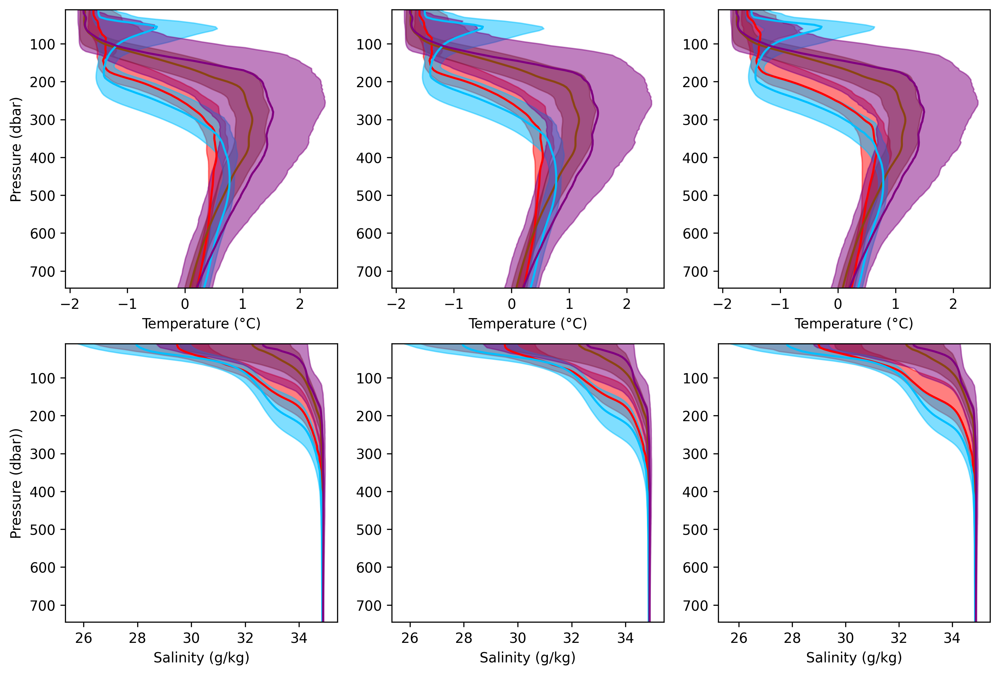

In [18]:
compare_average_profile(ds_fit_relabeled_750_latlonT_5_60_95_k4,ds_fit_relabeled_750_latlonT_5_50_95_k4,ds_fit_relabeled_750_latlonT_5_70_95_k4)

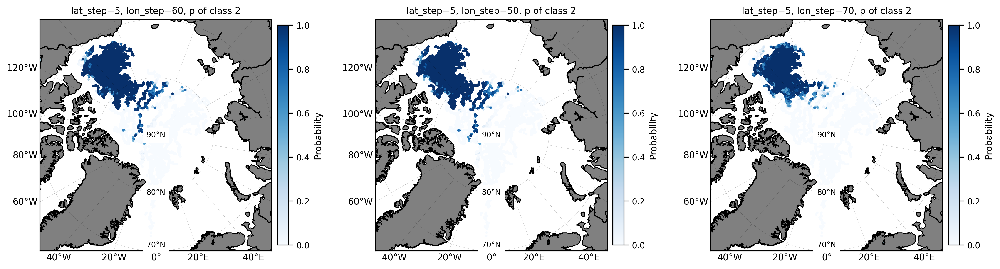

In [60]:
compare_probability(ds_fit_relabeled_750_latlonT_5_60_95_k4,ds_fit_relabeled_750_latlonT_5_50_95_k4,ds_fit_relabeled_750_latlonT_5_70_95_k4,class2compare=2)

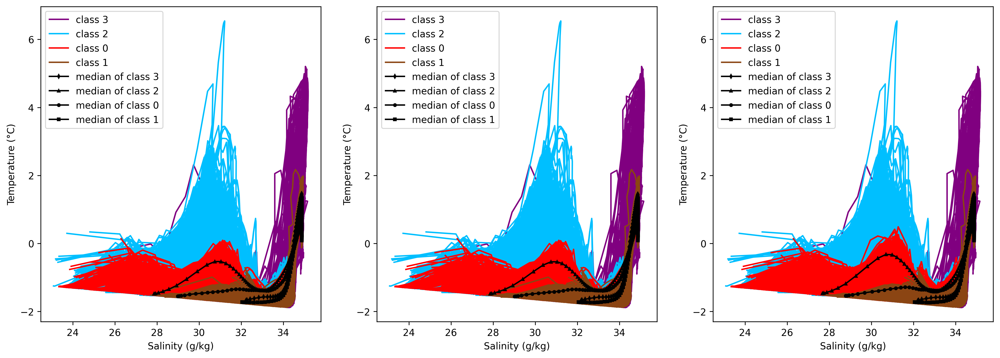

In [10]:
compare_san_temp_profiles(ds_fit_relabeled_750_latlonT_5_60_95_k4,ds_fit_relabeled_750_latlonT_5_50_95_k4,ds_fit_relabeled_750_latlonT_5_70_95_k4,sequence = [3,2,0,1])

# For 250 data

In [14]:
# load the relabeled data
Relabeled_data_path = 'D:/VScode/MRes/Clustering_under_the_ice/Relabeled_data/'
ds_fit_relabeled_250_latlonT_10_20_95_k4=xr.open_dataset(Relabeled_data_path + 'ds_fit_relabeled_250_latlonT_10_20_95_k4.nc')
ds_fit_relabeled_250_latlonT_10_10_95_k4=xr.open_dataset(Relabeled_data_path + 'ds_fit_relabeled_250_latlonT_10_10_95_k4.nc')
ds_fit_relabeled_250_latlonT_10_30_95_k4=xr.open_dataset(Relabeled_data_path + 'ds_fit_relabeled_250_latlonT_10_30_95_k4.nc')

C:\Users\zps19\AppData\Local\Temp\ipykernel_3332\2365631336.py:53: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_3332\2365631336.py:70: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_3332\2365631336.py:53: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_3332\2365631336.py:70: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_3332\2365631336.py:53: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_3332\2365631336.py:70: UserWarning: FixedFormatter should only be used toget

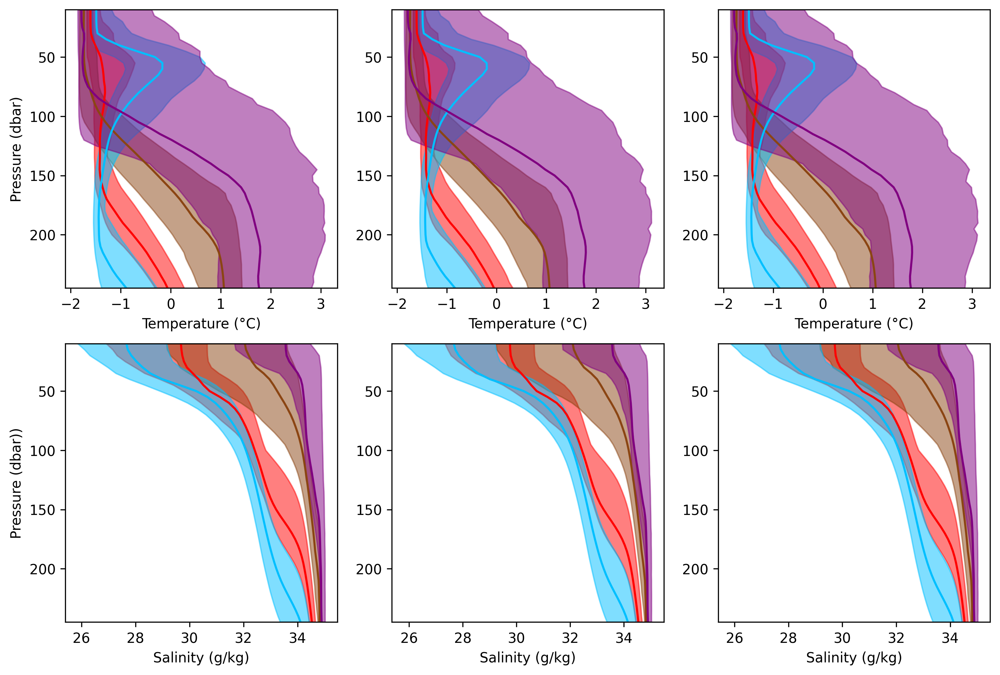

In [20]:
compare_average_profile(ds_fit_relabeled_250_latlonT_10_20_95_k4,ds_fit_relabeled_250_latlonT_10_10_95_k4,ds_fit_relabeled_250_latlonT_10_30_95_k4)

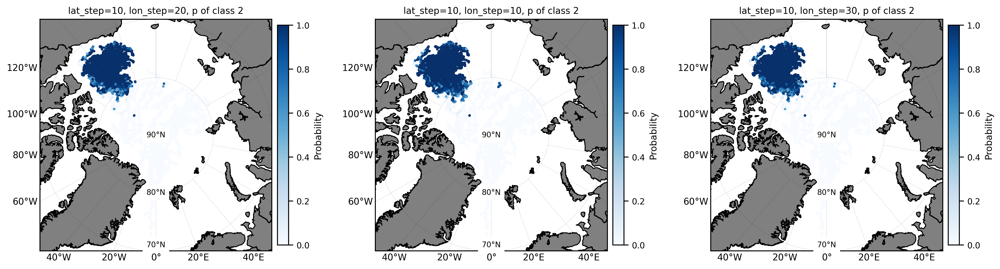

In [68]:
compare_probability(ds_fit_relabeled_250_latlonT_10_20_95_k4,ds_fit_relabeled_250_latlonT_10_10_95_k4,ds_fit_relabeled_250_latlonT_10_30_95_k4,class2compare=2)

d:\VScode\MRes\pz_venv_w1\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


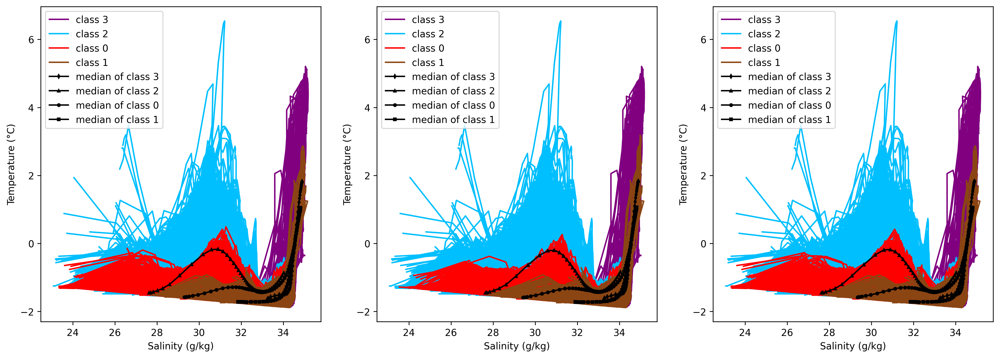

In [16]:
compare_san_temp_profiles(ds_fit_relabeled_250_latlonT_10_20_95_k4,ds_fit_relabeled_250_latlonT_10_10_95_k4,ds_fit_relabeled_250_latlonT_10_30_95_k4,sequence = [3,2,0,1])